In [1]:
%matplotlib inline

import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram

plt.style.use('ggplot')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13

In [2]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [3]:
sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav","15564-2-0-1.wav","31323-3-0-1.wav","46669-4-0-35.wav",
                   "89948-5-0-0.wav","40722-8-0-4.wav","103074-7-3-2.wav","106905-8-0-0.wav","108041-9-0-4.wav"]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)

/usr/local/var/pyenv/versions/anaconda3-4.1.0/envs/tensorflow/lib/python2.7/site-packages/matplotlib/font_manager.py:1288: UserWarning: findfont: Font family [u'serif'] not found. Falling back to Bitstream Vera Sans
  (prop.get_family(), self.defaultFamily[fontext]))


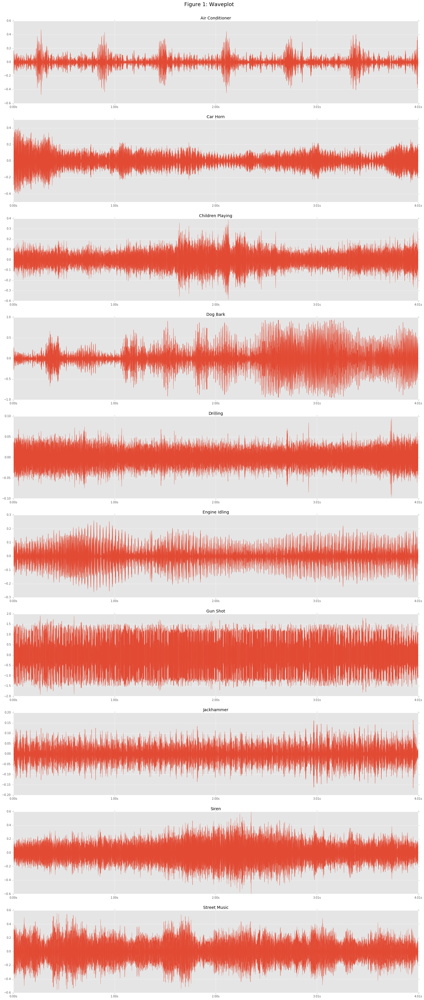

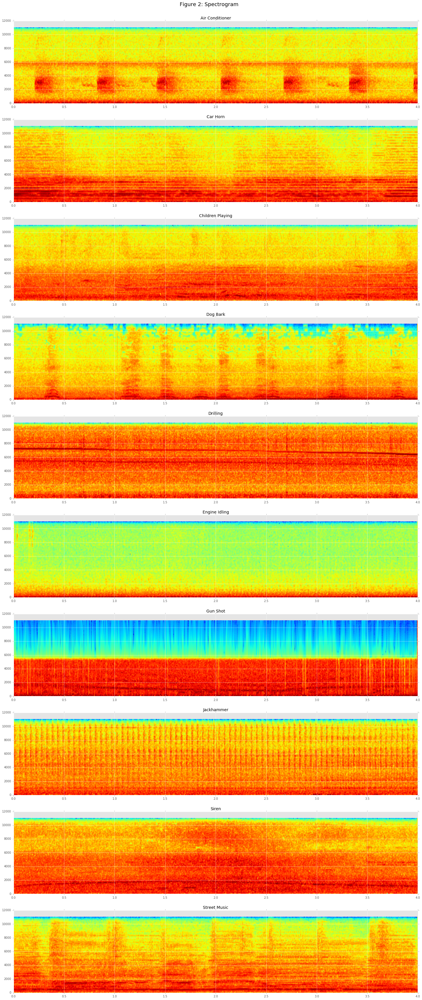

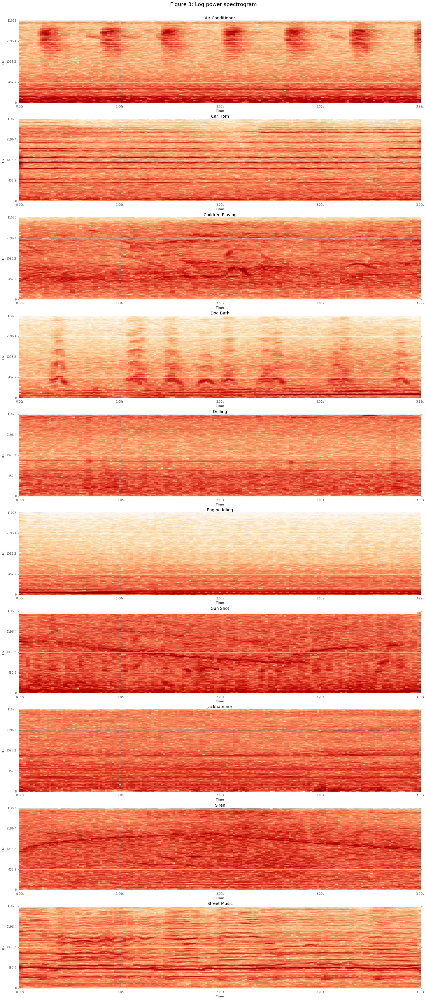

In [4]:
plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)

In [5]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dirs,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            # fn = current file name
            category = fn.split('/')[2].split('-')[1]
            print("Processing: %s, category: %s" % (fn, fn.split('/')[2].split('-')[1])  )

            mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn) # with librosa
            ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
            features = np.vstack([features,ext_features])
            labels = np.append(labels, category )
            
    return np.array(features), np.array(labels, dtype = np.int)

def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

In [6]:
parent_dir = 'Sound-Data'

sub_dirs = ['fold1','fold2','fold3','fold4','fold5','fold6']
features, labels = parse_audio_files(parent_dir,sub_dirs)

Processing: Sound-Data/fold1/101415-3-0-2.wav, category: 3


/usr/local/var/pyenv/versions/anaconda3-4.1.0/envs/tensorflow/lib/python2.7/site-packages/numpy/core/numeric.py:482: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return array(a, dtype, copy=False, order=order)


Processing: Sound-Data/fold1/101415-3-0-3.wav, category: 3
Processing: Sound-Data/fold1/101415-3-0-8.wav, category: 3
Processing: Sound-Data/fold1/102106-3-0-0.wav, category: 3
Processing: Sound-Data/fold1/102305-6-0-0.wav, category: 6
Processing: Sound-Data/fold1/102842-3-0-1.wav, category: 3
Processing: Sound-Data/fold1/102842-3-1-0.wav, category: 3
Processing: Sound-Data/fold1/102842-3-1-5.wav, category: 3
Processing: Sound-Data/fold1/102842-3-1-6.wav, category: 3
Processing: Sound-Data/fold1/103074-7-0-0.wav, category: 7
Processing: Sound-Data/fold1/103074-7-0-1.wav, category: 7
Processing: Sound-Data/fold1/103074-7-0-2.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-0.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-1.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-2.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-3.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-4.wav, category: 7
Processing: Sound-Data/fold1/103074-7-1-5.wav, category:

/usr/local/var/pyenv/versions/anaconda3-4.1.0/envs/tensorflow/lib/python2.7/site-packages/librosa/core/pitch.py:148: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


Processing: Sound-Data/fold1/17592-5-1-2.wav, category: 5
Processing: Sound-Data/fold1/17592-5-1-3.wav, category: 5
Processing: Sound-Data/fold1/176257-3-0-0.wav, category: 3
Processing: Sound-Data/fold1/176258-3-1-12.wav, category: 3
Processing: Sound-Data/fold1/176258-3-1-13.wav, category: 3
Processing: Sound-Data/fold1/176258-3-1-18.wav, category: 3
Processing: Sound-Data/fold1/176258-3-1-2.wav, category: 3
Processing: Sound-Data/fold1/176638-1-0-0.wav, category: 1
Processing: Sound-Data/fold1/176638-1-1-0.wav, category: 1
Processing: Sound-Data/fold1/176714-2-0-18.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-23.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-26.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-33.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-40.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-51.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-55.wav, category: 2
Processing: Sound-Data/fold1/176714-2-0-77.wav, 

/usr/local/var/pyenv/versions/anaconda3-4.1.0/envs/tensorflow/lib/python2.7/site-packages/librosa/util/utils.py:1478: RuntimeWarning: invalid value encountered in divide
  mask /= mask + (X_ref / Z)**power


Processing: Sound-Data/fold1/193394-3-0-4.wav, category: 3
Processing: Sound-Data/fold1/193394-3-0-7.wav, category: 3
Processing: Sound-Data/fold1/193698-2-0-112.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-113.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-114.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-140.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-42.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-58.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-64.wav, category: 2
Processing: Sound-Data/fold1/193698-2-0-89.wav, category: 2
Processing: Sound-Data/fold1/194732-9-0-126.wav, category: 9
Processing: Sound-Data/fold1/194732-9-0-163.wav, category: 9
Processing: Sound-Data/fold1/194732-9-0-171.wav, category: 9
Processing: Sound-Data/fold1/194732-9-0-175.wav, category: 9
Processing: Sound-Data/fold1/194732-9-0-191.wav, category: 9
Processing: Sound-Data/fold1/194732-9-0-41.wav, category: 9
Processing: Sound-Data/fold1/1947

In [7]:
labels = one_hot_encode(labels)

train_test_split = np.random.rand(len(features)) < 0.70
train_x = features[train_test_split]
train_y = labels[train_test_split]
test_x = features[~train_test_split]
test_y = labels[~train_test_split]

--------------------------------------------------------------------------------------------------------------------------

#### Training Neural Network with TensorFlow

In [8]:
import tensorflow as tf
from sklearn.metrics import precision_recall_fscore_support

In [30]:
training_epochs = 12500 #5000
n_dim = features.shape[1]
n_classes = 10
n_hidden_units_one = 740 #280 
n_hidden_units_two = 350 #300
sd = 1 / np.sqrt(n_dim)
learning_rate = 0.0075 #0.01

In [31]:
X = tf.placeholder(tf.float32,[None,n_dim])
Y = tf.placeholder(tf.float32,[None,n_classes])

W_1 = tf.Variable(tf.random_normal([n_dim,n_hidden_units_one], mean = 0, stddev=sd))
b_1 = tf.Variable(tf.random_normal([n_hidden_units_one], mean = 0, stddev=sd))
h_1 = tf.nn.tanh(tf.matmul(X,W_1) + b_1)


W_2 = tf.Variable(tf.random_normal([n_hidden_units_one,n_hidden_units_two], mean = 0, stddev=sd))
b_2 = tf.Variable(tf.random_normal([n_hidden_units_two], mean = 0, stddev=sd))
h_2 = tf.nn.sigmoid(tf.matmul(h_1,W_2) + b_2)


W = tf.Variable(tf.random_normal([n_hidden_units_two,n_classes], mean = 0, stddev=sd))
b = tf.Variable(tf.random_normal([n_classes], mean = 0, stddev=sd))
y_ = tf.nn.softmax(tf.matmul(h_2,W) + b)

init = tf.initialize_all_variables()

In [32]:
cost_function = tf.reduce_mean(-tf.reduce_sum(Y * tf.log(y_), reduction_indices=[1])) 
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost_function)

correct_prediction = tf.equal(tf.argmax(y_,1), tf.argmax(Y,1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

In [33]:
cost_history = np.empty(shape=[1],dtype=float)
y_true, y_pred = None, None
with tf.Session() as sess:
    sess.run(init)
    for epoch in range(training_epochs):            
        _,cost = sess.run([optimizer,cost_function],feed_dict={X:train_x,Y:train_y})
        cost_history = np.append(cost_history,cost)
    
    y_pred = sess.run(tf.argmax(y_,1),feed_dict={X: test_x})
    y_true = sess.run(tf.argmax(test_y,1))

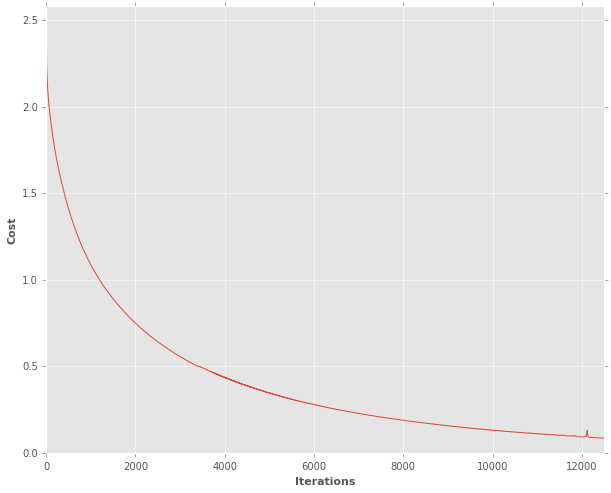

F-Score: 0.899


In [34]:
fig = plt.figure(figsize=(10,8))
plt.plot(cost_history)
plt.ylabel("Cost")
plt.xlabel("Iterations")
plt.axis([0,training_epochs,0,np.max(cost_history)])
plt.show()

p,r,f,s = precision_recall_fscore_support(y_true, y_pred, average='micro')
print "F-Score:", round(f,3)

In [29]:
# Save model

#saver = tf.train.Saver()
#save_path = saver.save(s, "model.ckpt")
#print("Model saved in file: %s" % save_path)


TypeError: 'sess' must be a Session; None